# Version on Azure Databricks [`Unity Catalog`]

This version was crafted base on [Tutorial: End-to-end classic ML models on Databricks](https://docs.databricks.com/aws/en/mlflow/end-to-end-example).

## Unity Catalog setup
Set the catalog and schema where the model will be registered. You must have USE CATALOG privilege on the catalog, and CREATE MODEL and USE SCHEMA privileges on the schema. Change the catalog and schema here if necessary.

In [0]:
import mlflow

mlflow.set_registry_uri("databricks-uc")
CATALOG_NAME = "financiallungcancer_uc_ws"
SCHEMA_NAME = "finlungcancer_schema"

## 1 - Packages

In [0]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import FunctionTransformer

from xgboost import XGBClassifier, XGBRegressor

In [0]:
pd.set_option('display.max_columns', None)
#pd.set_option('display.max_rows', None)

## 2 - Data

In [0]:
#df = pd.read_csv('2018_2021.csv')

# Read the data using Spark.SQL
raw_df = spark.sql("""
SELECT * FROM financiallungcancer_uc_ws.finlungcancer_schema.2018_2021
""")

# Convert to Pandas DataFrame
df = raw_df.toPandas()

print(df.shape)
df.head(2)

(35620, 33)


,Hospital Service Area,Hospital County,Operating Certificate Number,Permanent Facility Id,Facility Name,Age Group,Zip Code - 3 digits,Gender,Race,Ethnicity,Length of Stay,Type of Admission,Patient Disposition,Discharge Year,CCSR Diagnosis Code,CCSR Diagnosis Description,CCSR Procedure Code,CCSR Procedure Description,APR DRG Code,APR DRG Description,APR MDC Code,APR MDC Description,APR Severity of Illness Code,APR Severity of Illness Description,APR Risk of Mortality,APR Medical Surgical Description,Payment Typology 1,Payment Typology 2,Payment Typology 3,Birth Weight,Emergency Department Indicator,Total Charges,Total Costs
0,New York City,Queens,7003004.0,1630.0,Long Island Jewish Medical Center,70 or Older,117,F,White,Not Span/Hispanic,4,Elective,Home or Self Care,2018,NEO022,RESPIRATORY CANCERS,RES008,"LUNG, PLEURA, OR DIAPHRAGM RESECTION (OPEN AND...",120.0,MAJOR RESPIRATORY & CHEST PROCEDURES,4.0,DISEASES AND DISORDERS OF THE RESPIRATORY SYSTEM,2.0,Moderate,Moderate,Surgical,Medicare,Federal/State/Local/VA,Self-Pay,None,False,92851.10,18624.97
1,New York City,Queens,7003004.0,1630.0,Long Island Jewish Medical Center,70 or Older,114,M,Other Race,Not Span/Hispanic,1,Elective,Home or Self Care,2018,NEO022,RESPIRATORY CANCERS,RES012,RELEASE OF LUNG AND PLEURA,121.0,OTHER RESPIRATORY & CHEST PROCEDURES,4.0,DISEASES AND DISORDERS OF THE RESPIRATORY SYSTEM,1.0,Minor,Minor,Surgical,Private Health Insurance,Self-Pay,None,None,False,34994.93,7536.27


In [0]:
df = df.reindex(columns=['CCSR Procedure Description', 'Discharge Year', 'Age Group', 'Type of Admission', 
                         'Patient Disposition', 'APR DRG Description', 'APR Severity of Illness Description', 
                         'APR Medical Surgical Description', 'Payment Typology 1', 'Total Charges', 
                         'Permanent Facility Id'])

df = df.rename(columns={'CCSR Procedure Description': 'ccsr_procedure_description', 
                        'Discharge Year': 'discharge_year', 
                        'Age Group': 'age_group', 
                        'Type of Admission': 'type_of_admission', 
                        'Patient Disposition': 'patient_disposition', 
                        'APR DRG Description': 'apr_drg_description', 
                        'APR Severity of Illness Description': 'apr_severity_of_illness_description', 
                        'APR Medical Surgical Description': 'apr_medical_surgical_description', 
                        'Payment Typology 1': 'payment_typology_1', 
                        'Total Charges': 'total_charges', 
                        'Permanent Facility Id': 'permanent_facility_id'})

df.head(2)

,ccsr_procedure_description,discharge_year,age_group,type_of_admission,patient_disposition,apr_drg_description,apr_severity_of_illness_description,apr_medical_surgical_description,payment_typology_1,total_charges,permanent_facility_id
0,"LUNG, PLEURA, OR DIAPHRAGM RESECTION (OPEN AND...",2018,70 or Older,Elective,Home or Self Care,MAJOR RESPIRATORY & CHEST PROCEDURES,Moderate,Surgical,Medicare,92851.10,1630.0
1,RELEASE OF LUNG AND PLEURA,2018,70 or Older,Elective,Home or Self Care,OTHER RESPIRATORY & CHEST PROCEDURES,Minor,Surgical,Private Health Insurance,34994.93,1630.0


In [0]:
df.isna().sum().sort_values(ascending=False)
# df.isnull().sum().sort_values(ascending=False)

ccsr_procedure_description             4301
permanent_facility_id                     8
discharge_year                            0
age_group                                 0
type_of_admission                         0
patient_disposition                       0
apr_drg_description                       0
apr_severity_of_illness_description       0
apr_medical_surgical_description          0
payment_typology_1                        0
total_charges                             0
dtype: int64

## 3 - Missing Value Imputation & Mapping Categorical and Discrete Features
- `CCSR Procedure Description`: **4301** cases could be consider **MCAR**, since are not related to any other values - Strategy: `Mode Imputation`
- `Permanent Facility Id`: **8** cases should be consider **MNAR**, since it states "*Redacted for Confidentiality*" - Strategy: `Classifier`
> - Check out `Discriminant Function Imputation` for further applications

In [0]:
# CCSR Procedure Description
ct = ColumnTransformer(transformers = [('CCSR', SimpleImputer(strategy='most_frequent'), 
                                        ['ccsr_procedure_description'])], remainder='passthrough')
ct_CCSR = ct.fit_transform(df)
df = pd.DataFrame(ct_CCSR, columns = df.columns)

In [0]:
def mapping(df):

    le = LabelEncoder()
    df["age_group"] = le.fit_transform(df["age_group"])
    df["type_of_admission"] = le.fit_transform(df["type_of_admission"])
    df["apr_medical_surgical_description"] = le.fit_transform(df["apr_medical_surgical_description"])
    df["patient_disposition"] = le.fit_transform(df["patient_disposition"])
    df["apr_severity_of_illness_description"] = le.fit_transform(df["apr_severity_of_illness_description"])
    df["apr_drg_description"] = le.fit_transform(df["apr_drg_description"])
    df["ccsr_procedure_description"] = le.fit_transform(df["ccsr_procedure_description"])
    df["payment_typology_1"] = le.fit_transform(df["payment_typology_1"])

    return df

In [0]:
df = mapping(df)
df.head(2)

,ccsr_procedure_description,discharge_year,age_group,type_of_admission,patient_disposition,apr_drg_description,apr_severity_of_illness_description,apr_medical_surgical_description,payment_typology_1,total_charges,permanent_facility_id
0,103,2018,4,0,7,7,3,1,5,92851.1,1630.0
1,145,2018,4,0,7,13,2,1,7,34994.93,1630.0


In [0]:
df.isna().sum().sort_values(ascending=False)
# df.isnull().sum().sort_values(ascending=False)

permanent_facility_id                  8
ccsr_procedure_description             0
discharge_year                         0
age_group                              0
type_of_admission                      0
patient_disposition                    0
apr_drg_description                    0
apr_severity_of_illness_description    0
apr_medical_surgical_description       0
payment_typology_1                     0
total_charges                          0
dtype: int64

In [0]:
# # CCSR Procedure Description
# ct = ColumnTransformer(transformers = [('CCSR', SimpleImputer(strategy='most_frequent'), 
#                                         ['CCSR Procedure Description'])], remainder='passthrough')
# ct_CCSR = ct.fit_transform(train_df)
# train_df_ccsr = pd.DataFrame(ct_CCSR, columns = train_df.columns)

# Permanent Facility Id
def facilityId_imputation(df):
    
    train_0 = df[df['permanent_facility_id'].notnull()] # df == train_df
    y_0 = train_0.iloc[:,10:11].values.ravel().astype(int)
    test_0 = df[df['permanent_facility_id'].isnull()]   # df == train_df

    scaler = StandardScaler()
    train_0_norm = scaler.fit_transform(train_0.iloc[:,:10])
    train_0_norm = pd.DataFrame(train_0_norm, columns = train_0.iloc[:,:10].columns)
    test_0_norm = scaler.fit_transform(test_0.iloc[:,:10])
    test_0_norm = pd.DataFrame(test_0_norm, columns = test_0.iloc[:,:10].columns)
    
    #clssfr = XGBClassifier() # use_label_encoder=False --> deprecated. 
    #Streamlit - ValueError: Invalid classes inferred from unique values of `y`
    clssfr = LogisticRegression(max_iter=500)
    clssfr.fit(train_0_norm, y_0)

    for i, j in enumerate(test_0.index[:len(clssfr.predict(test_0_norm))]):
        df['permanent_facility_id'].loc[j] = clssfr.predict(test_0_norm)[i]
    
    return df

df_toOHE = facilityId_imputation(df)

/databricks/python/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/databricks/python/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
  warnings.warn(


Uploading artifacts:   0%|          | 0/1 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

/root/.ipykernel/945/command-3117160447461355-2987155702:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['permanent_facility_id'].loc[j] = clssfr.predict(test_0_norm)[i]
/root/.ipykernel/945/command-3117160447461355-2987155702:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['permanent_facility_id'].loc[j] = clssfr.predict(test_0_norm)[i]
/root/.ipykernel/945/command-3117160447461355-2987155702:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-vie

In [0]:
df_toOHE.isna().sum().sort_values(ascending=False)

ccsr_procedure_description             0
discharge_year                         0
age_group                              0
type_of_admission                      0
patient_disposition                    0
apr_drg_description                    0
apr_severity_of_illness_description    0
apr_medical_surgical_description       0
payment_typology_1                     0
total_charges                          0
permanent_facility_id                  0
dtype: int64

In [0]:
df_toOHE.head(2)

,ccsr_procedure_description,discharge_year,age_group,type_of_admission,patient_disposition,apr_drg_description,apr_severity_of_illness_description,apr_medical_surgical_description,payment_typology_1,total_charges,permanent_facility_id
0,103,2018,4,0,7,7,3,1,5,92851.1,1630.0
1,145,2018,4,0,7,13,2,1,7,34994.93,1630.0


## 4 - One Hot Encoder
Checking cardinality

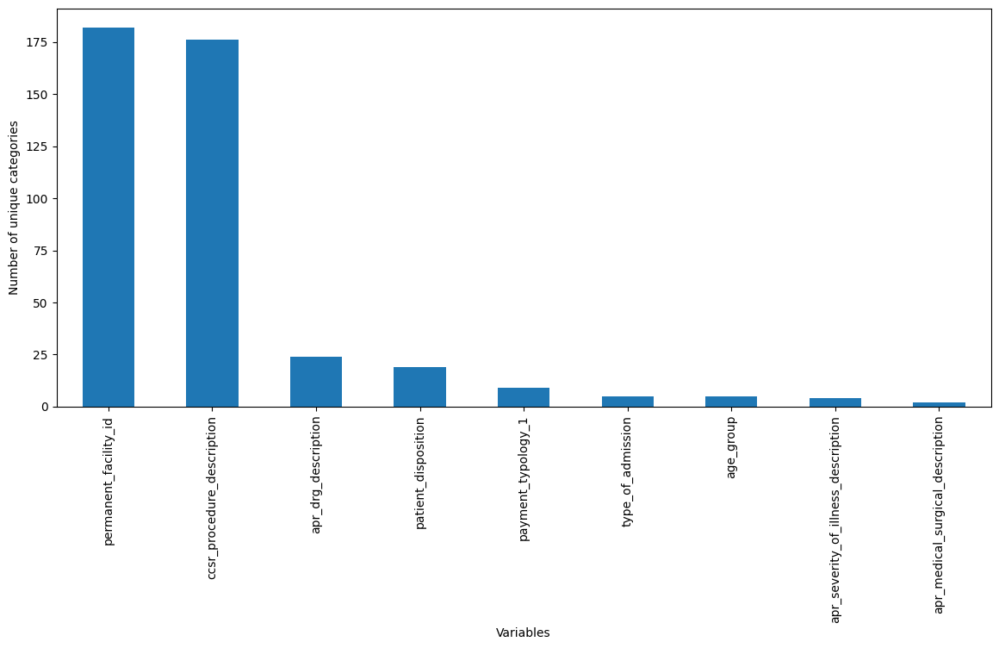

In [0]:
df_cardinality = df_toOHE.drop(['total_charges', 'discharge_year'], axis=1)
df_cardinality = df_toOHE.reindex(columns=['permanent_facility_id', 'ccsr_procedure_description',  
                                           'apr_drg_description', 'patient_disposition', 'payment_typology_1', 
                                           'type_of_admission', 'age_group', 'apr_severity_of_illness_description', 
                                           'apr_medical_surgical_description'])
df_cardinality.nunique().plot.bar(figsize=(14,6))
plt.ylabel('Number of unique categories')
plt.xlabel('Variables')
#plt.title('Cardinality')
#plt.axhline(y = 10, color= 'r', linestyle='--')
plt.show()

In [0]:
ct_oh = ColumnTransformer(transformers = [('OHE', OneHotEncoder(sparse=False), ['age_group', 'type_of_admission', 
                                                                                'patient_disposition', 
                                                                                'apr_medical_surgical_description',
                                                                                'payment_typology_1'])],
                       remainder='passthrough')

ct_oh_categorical = ct_oh.fit_transform(df_toOHE)
oh_columns = ct_oh.get_feature_names_out()
#oh_columns
ct_oh_categorical

/databricks/python/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


array([[0.0, 0.0, 0.0, ..., 3, 92851.1, 1630.0],
       [0.0, 0.0, 0.0, ..., 2, 34994.93, 1630.0],
       [0.0, 0.0, 0.0, ..., 0, 53256.78, 829.0],
       ...,
       [0.0, 0.0, 0.0, ..., 0, 167890.18, 3058.0],
       [0.0, 0.0, 0.0, ..., 1, 269262.76, 3058.0],
       [0.0, 0.0, 0.0, ..., 2, 115035.14, 1045.0]], dtype=object)

In [0]:
oh_columns

array(['OHE__age_group_0', 'OHE__age_group_1', 'OHE__age_group_2',
       'OHE__age_group_3', 'OHE__age_group_4', 'OHE__type_of_admission_0',
       'OHE__type_of_admission_1', 'OHE__type_of_admission_2',
       'OHE__type_of_admission_3', 'OHE__type_of_admission_4',
       'OHE__patient_disposition_0', 'OHE__patient_disposition_1',
       'OHE__patient_disposition_2', 'OHE__patient_disposition_3',
       'OHE__patient_disposition_4', 'OHE__patient_disposition_5',
       'OHE__patient_disposition_6', 'OHE__patient_disposition_7',
       'OHE__patient_disposition_8', 'OHE__patient_disposition_9',
       'OHE__patient_disposition_10', 'OHE__patient_disposition_11',
       'OHE__patient_disposition_12', 'OHE__patient_disposition_13',
       'OHE__patient_disposition_14', 'OHE__patient_disposition_15',
       'OHE__patient_disposition_16', 'OHE__patient_disposition_17',
       'OHE__patient_disposition_18',
       'OHE__apr_medical_surgical_description_0',
       'OHE__apr_medical_surgical

In [0]:
train_df = pd.DataFrame(ct_oh_categorical, columns = oh_columns)

train_df = train_df.reindex(columns=['remainder__discharge_year', 'OHE__age_group_0', 'OHE__age_group_1', 'OHE__age_group_2',
                                       'OHE__age_group_3', 'OHE__age_group_4', 'OHE__type_of_admission_0',
                                       'OHE__type_of_admission_1', 'OHE__type_of_admission_2',
                                       'OHE__type_of_admission_3', 'OHE__type_of_admission_4',
                                       'OHE__patient_disposition_0', 'OHE__patient_disposition_1',
                                       'OHE__patient_disposition_2', 'OHE__patient_disposition_3',
                                       'OHE__patient_disposition_4', 'OHE__patient_disposition_5',
                                       'OHE__patient_disposition_6', 'OHE__patient_disposition_7',
                                       'OHE__patient_disposition_8', 'OHE__patient_disposition_9',
                                       'OHE__patient_disposition_10', 'OHE__patient_disposition_11',
                                       'OHE__patient_disposition_12', 'OHE__patient_disposition_13',
                                       'OHE__patient_disposition_14', 'OHE__patient_disposition_15',
                                       'OHE__patient_disposition_16', 'OHE__patient_disposition_17',
                                       'OHE__patient_disposition_18',
                                       'OHE__apr_medical_surgical_description_0',
                                       'OHE__apr_medical_surgical_description_1',
                                       'OHE__payment_typology_1_0', 'OHE__payment_typology_1_1',
                                       'OHE__payment_typology_1_2', 'OHE__payment_typology_1_3',
                                       'OHE__payment_typology_1_4', 'OHE__payment_typology_1_5',
                                       'OHE__payment_typology_1_6', 'OHE__payment_typology_1_7',
                                       'OHE__payment_typology_1_8',
                                       'remainder__ccsr_procedure_description',
                                       'remainder__apr_drg_description',
                                       'remainder__apr_severity_of_illness_description',
                                       'remainder__permanent_facility_id', 'remainder__total_charges'])

train_df.drop_duplicates(keep='first', inplace=True)

# FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. 
# `sparse_output` is ignored unless you leave `sparse` to its default value.

train_df.head(2)

,remainder__discharge_year,OHE__age_group_0,OHE__age_group_1,OHE__age_group_2,OHE__age_group_3,OHE__age_group_4,OHE__type_of_admission_0,OHE__type_of_admission_1,OHE__type_of_admission_2,OHE__type_of_admission_3,OHE__type_of_admission_4,OHE__patient_disposition_0,OHE__patient_disposition_1,OHE__patient_disposition_2,OHE__patient_disposition_3,OHE__patient_disposition_4,OHE__patient_disposition_5,OHE__patient_disposition_6,OHE__patient_disposition_7,OHE__patient_disposition_8,OHE__patient_disposition_9,OHE__patient_disposition_10,OHE__patient_disposition_11,OHE__patient_disposition_12,OHE__patient_disposition_13,OHE__patient_disposition_14,OHE__patient_disposition_15,OHE__patient_disposition_16,OHE__patient_disposition_17,OHE__patient_disposition_18,OHE__apr_medical_surgical_description_0,OHE__apr_medical_surgical_description_1,OHE__payment_typology_1_0,OHE__payment_typology_1_1,OHE__payment_typology_1_2,OHE__payment_typology_1_3,OHE__payment_typology_1_4,OHE__payment_typology_1_5,OHE__payment_typology_1_6,OHE__payment_typology_1_7,OHE__payment_typology_1_8,remainder__ccsr_procedure_description,remainder__apr_drg_description,remainder__apr_severity_of_illness_description,remainder__permanent_facility_id,remainder__total_charges
0,2018,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,103,7,3,1630.0,92851.1
1,2018,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,145,13,2,1630.0,34994.93


## 5 - Model
We need `Discharge Year` here because data split, but not in unseen data

In [0]:
X_train = train_df.drop(train_df[train_df['remainder__discharge_year'] > 2020].index)
X_train = X_train.iloc[:,1:-1].to_numpy()
X_valid = train_df.drop(train_df[train_df['remainder__discharge_year'] < 2021].index)
X_valid = X_valid.iloc[:,1:-1].to_numpy()
y_train = train_df.drop(train_df[train_df['remainder__discharge_year'] > 2020].index)
y_train = y_train.iloc[:,-1:].to_numpy()
y_valid = train_df.drop(train_df[train_df['remainder__discharge_year'] < 2021].index)
y_valid = y_valid.iloc[:,-1:].to_numpy()

print(f"X_train Shape    : {X_train.shape}, | y_train Shape    : {y_train.shape}")
print("X_train Dimension:", X_train.ndim, "           | y_train Dimension:", y_train.ndim)
print(f"X_valid Shape    : {X_valid.shape},  | y_valid Shape    : {y_valid.shape}")
print("X_valid Dimension:", X_valid.ndim, "           | y_valid Dimension:", y_valid.ndim)

X_train Shape    : (27151, 44), | y_train Shape    : (27151, 1)
X_train Dimension: 2            | y_train Dimension: 2
X_valid Shape    : (8419, 44),  | y_valid Shape    : (8419, 1)
X_valid Dimension: 2            | y_valid Dimension: 2


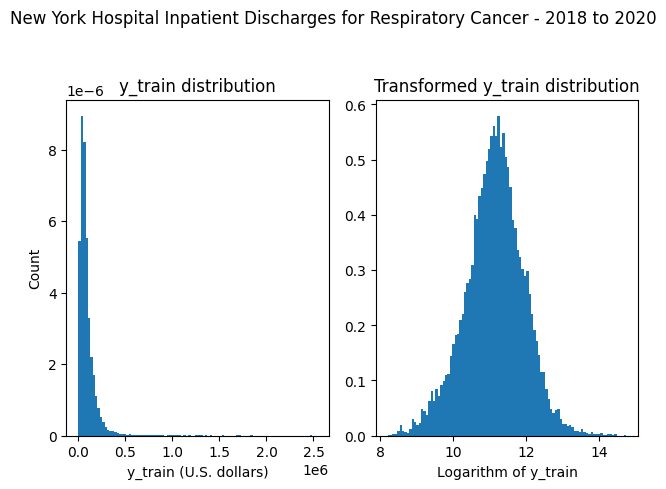

In [0]:
y_train_ = np.asarray(y_train, dtype=np.float64)
y_train_trans = np.log(y_train_ + 3000)

f, (ax0, ax1) = plt.subplots(1, 2)

ax0.hist(y_train, bins=100, density=True)
ax0.set_ylabel("Count")
ax0.set_xlabel("y_train (U.S. dollars)")
ax0.set_title("y_train distribution")

ax1.hist(y_train_trans, bins=100, density=True)
#ax1.set_ylabel("Count")
ax1.set_xlabel("Logarithm of y_train")
ax1.set_title("Transformed y_train distribution")

f.suptitle("New York Hospital Inpatient Discharges for Respiratory Cancer - 2018 to 2020", y=1.01)
plt.tight_layout()

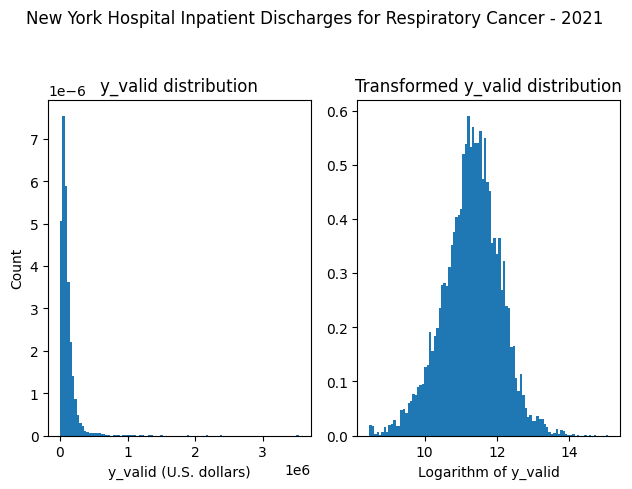

In [0]:
y_valid_ = np.asarray(y_valid, dtype=np.float64)
y_valid_trans = np.log(y_valid_ + 3000)

f, (ax0, ax1) = plt.subplots(1, 2)

ax0.hist(y_valid, bins=100, density=True)
ax0.set_ylabel("Count")
ax0.set_xlabel("y_valid (U.S. dollars)")
ax0.set_title("y_valid distribution")

ax1.hist(y_valid_trans, bins=100, density=True)
#ax1.set_ylabel("Count")
ax1.set_xlabel("Logarithm of y_valid")
ax1.set_title("Transformed y_valid distribution")

f.suptitle("New York Hospital Inpatient Discharges for Respiratory Cancer - 2021", y=1.01)
plt.tight_layout()

In [0]:
# model_plot_importance = XGBRegressor(n_estimators=1000, max_depth=4, learning_rate=0.1)
# model_plot_importance.fit(X_train, y_train_trans)

# https://discuss.huggingface.co/t/problem-in-xgboost-with-hosted-infernece-api/30376/10
model = Pipeline([('transform', FunctionTransformer(np.float64)), 
                  ('regressor', XGBRegressor(n_estimators=1000, max_depth=4, learning_rate=0.1))])

#model = XGBRegressor(n_estimators=1000, max_depth=4, learning_rate=0.1)
#model = LinearRegression()
model.fit(X_train, y_train_trans)

preds = model.predict(X_valid)
# Let's increase our second predictions by 7.167231% according to the Inflation Annual Change - IP (HCC 2021)
preds_ = (np.exp(preds) - 3000) * 1.0717

Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

In [0]:
print("R2_Score: ", r2_score(y_valid, preds_))
print("MSE     : ", mean_squared_error(y_valid, preds_))
print("RMSE    : ", mean_squared_error(y_valid, preds_, squared=False))
print("MAE     : ", mean_absolute_error(y_valid, preds_))
print("MAPE    : ", mean_absolute_percentage_error(y_valid, preds_))

R2_Score:  0.47161778993922776
MSE     :  7084722548.971288
RMSE    :  84170.79391909814
MAE     :  39332.721491117794
MAPE    :  0.39750757493416605


## 6 - We'll use `MLflow` to keep track of the model's accuracy and save the model for later use.

In [0]:
import mlflow.pyfunc
import mlflow.sklearn
import numpy as np
import sklearn
import xgboost as xgb
from mlflow.models.signature import infer_signature
from mlflow.utils.environment import _mlflow_conda_env
import cloudpickle
import time

# Wrapper class for XGBRegressor
class SklearnModelWrapper(mlflow.pyfunc.PythonModel):
    def __init__(self, model):
        self.model = model

    def predict(self, context, model_input):
        return self.model.predict(model_input)

# Start MLflow run
with mlflow.start_run(run_name='untuned_xgb_regressor'):
    n_estimators=1000
    model = Pipeline([('transform', FunctionTransformer(np.float64)), 
                  ('regressor', XGBRegressor(n_estimators=n_estimators, max_depth=4, learning_rate=0.1))])
    model.fit(X_train, y_train_trans)

    # Predict using the trained model
    preds = model.predict(X_valid)
    # Let's increase our second predictions by 7.167231% according to the Inflation Annual Change - IP (HCC 2021)
    preds_ = (np.exp(preds) - 3000) * 1.0717
    r2_scr_result = r2_score(y_valid, preds_)
    mse_score = mean_squared_error(y_valid, preds_)
    rmse_score = mean_squared_error(y_valid, preds_, squared=False)
    mae_score = mean_absolute_error(y_valid, preds_)
    mape_score = mean_absolute_percentage_error(y_valid, preds_)

    # Log parameters and metrics
    mlflow.log_param('n_estimators', n_estimators)
    mlflow.log_metric('r2', r2_scr_result)
    mlflow.log_metric('mse', mse_score)
    mlflow.log_metric('rmse', rmse_score)
    mlflow.log_metric('mae', mae_score)
    mlflow.log_metric('mape', mape_score)

    wrappedModel = SklearnModelWrapper(model)

    # Infer model signature
    signature = infer_signature(X_train, wrappedModel.predict(None, X_train))

    # Create conda environment for MLflow
    conda_env = _mlflow_conda_env(
        additional_conda_deps=None,
        additional_pip_deps=[
            "cloudpickle=={}".format(cloudpickle.__version__), 
            "scikit-learn=={}".format(sklearn.__version__), 
            "xgboost=={}".format(xgb.__version__)
        ],
        additional_conda_channels=None,
    )

    # Log the model
    mlflow.pyfunc.log_model("xgb_regressor_model", python_model=wrappedModel, conda_env=conda_env, signature=signature)

Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

#### Review the learned feature importances output by the model.

In [0]:
# Convert X_train to DataFrame if it's not already
X_train_df = pd.DataFrame(X_train, columns=[f'feature_{i}' for i in range(X_train.shape[1])])

# Extract feature importances
feature_importances = pd.DataFrame(
    model.named_steps['regressor'].feature_importances_,
    index=X_train_df.columns.tolist(),
    columns=['importance']
)

# Sort feature importances
feature_importances.sort_values('importance', ascending=False, inplace=True)

display(feature_importances)

importance
0.22116171
0.11186878
0.08285066
0.08154912
0.06995736
0.058830135
0.04453692
0.03098093
0.02980778
0.023840062


We logged the R2 score and RMSE to MLflow. Click the Experiment icon <img src="https://docs.databricks.com/_static/images/icons/experiment.png"/> in the right sidebar to display the Experiment Runs sidebar. 

The model achieved an r2 score of 0.4471 & RMSE of 86,104.

#### Register the model to Unity Catalog

By registering this model to Unity Catalog, you can easily reference the model from anywhere within `Databricks`.

The following section shows how to do this programmatically, but you can also register a model using the UI.

In [0]:
run_id = mlflow.search_runs(filter_string='tags.mlflow.runName = "untuned_xgb_regressor"').iloc[0].run_id

In [0]:
# Register the model to Unity Catalog. 
model_name = f"{CATALOG_NAME}.{SCHEMA_NAME}.fin_luncancer"
model_version = mlflow.register_model(f"runs:/{run_id}/xgb_regressor_model", model_name)

# Registering the model takes a few seconds, so add a small delay
time.sleep(15)

Registered model 'financiallungcancer_uc_ws.finlungcancer_schema.fin_luncancer' already exists. Creating a new version of this model...


Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

Created version '4' of model 'financiallungcancer_uc_ws.finlungcancer_schema.fin_luncancer'.


To view the model in Unity Catalog, click **Catalog** in the left nav bar, and use the Catalog Explorer tree to navigate to the catalog and schema you specified at the beginning of this notebook. The new model appears in the schema, under **Models**.

<img src="https://docs.databricks.com/_static/images/mlflow/end-to-end-example/model-in-uc.png"/>

Next, assign this model the "Champion" tag, and load it into this notebook from Unity Catalog.

In [0]:
from mlflow.tracking import MlflowClient

client = MlflowClient()
client.set_registered_model_alias(model_name, "Champion", model_version.version)

In Unity Catalog, the model version now has the tag "Champion". 

You can now refer to the model using the path "models:/{model_name}@Champion".

Let's check the `print` first!

In [0]:
#print(f'r2score: {r2_score(y_valid, model.predict(X_valid))}')
print(f'r2score: {r2_score(y_valid, (np.exp(model.predict(X_valid)) - 3000) * 1.0717)}')

r2score: 0.47161778993922776


In [0]:
model = mlflow.pyfunc.load_model(f"models:/{model_name}@Champion")

# Sanity-check: This should match the r2 score logged by MLflow
print(f'r2score: {r2_score(y_valid, (np.exp(model.predict(X_valid)) - 3000) * 1.0717)}')

r2score: 0.47161778993922776


#===================================
#===================================

#Experiment with a new model

Use the second xgboost approach with `Length of Stay` to train a more accurate model.

In [0]:
# Convert to Pandas DataFrame
df_los = raw_df.toPandas()
print(df_los.shape)
df_los.head(2)

(35620, 33)


,Hospital Service Area,Hospital County,Operating Certificate Number,Permanent Facility Id,Facility Name,Age Group,Zip Code - 3 digits,Gender,Race,Ethnicity,Length of Stay,Type of Admission,Patient Disposition,Discharge Year,CCSR Diagnosis Code,CCSR Diagnosis Description,CCSR Procedure Code,CCSR Procedure Description,APR DRG Code,APR DRG Description,APR MDC Code,APR MDC Description,APR Severity of Illness Code,APR Severity of Illness Description,APR Risk of Mortality,APR Medical Surgical Description,Payment Typology 1,Payment Typology 2,Payment Typology 3,Birth Weight,Emergency Department Indicator,Total Charges,Total Costs
0,New York City,Queens,7003004.0,1630.0,Long Island Jewish Medical Center,70 or Older,117,F,White,Not Span/Hispanic,4,Elective,Home or Self Care,2018,NEO022,RESPIRATORY CANCERS,RES008,"LUNG, PLEURA, OR DIAPHRAGM RESECTION (OPEN AND...",120.0,MAJOR RESPIRATORY & CHEST PROCEDURES,4.0,DISEASES AND DISORDERS OF THE RESPIRATORY SYSTEM,2.0,Moderate,Moderate,Surgical,Medicare,Federal/State/Local/VA,Self-Pay,None,False,92851.10,18624.97
1,New York City,Queens,7003004.0,1630.0,Long Island Jewish Medical Center,70 or Older,114,M,Other Race,Not Span/Hispanic,1,Elective,Home or Self Care,2018,NEO022,RESPIRATORY CANCERS,RES012,RELEASE OF LUNG AND PLEURA,121.0,OTHER RESPIRATORY & CHEST PROCEDURES,4.0,DISEASES AND DISORDERS OF THE RESPIRATORY SYSTEM,1.0,Minor,Minor,Surgical,Private Health Insurance,Self-Pay,None,None,False,34994.93,7536.27


In [0]:
df_los = df_los.reindex(columns=['CCSR Procedure Description', 'Discharge Year', 'Age Group', 'Type of Admission', 'Length of Stay',
                         'Patient Disposition', 'APR DRG Description', 'APR Severity of Illness Description', 
                         'APR Medical Surgical Description', 'Payment Typology 1', 'Total Charges', 
                         'Permanent Facility Id'])

df_los = df_los.rename(columns={'CCSR Procedure Description': 'ccsr_procedure_description', 
                        'Discharge Year': 'discharge_year', 
                        'Age Group': 'age_group',
                        'Length of Stay': 'length_of_stay', 
                        'Type of Admission': 'type_of_admission', 
                        'Patient Disposition': 'patient_disposition', 
                        'APR DRG Description': 'apr_drg_description', 
                        'APR Severity of Illness Description': 'apr_severity_of_illness_description', 
                        'APR Medical Surgical Description': 'apr_medical_surgical_description', 
                        'Payment Typology 1': 'payment_typology_1', 
                        'Total Charges': 'total_charges', 
                        'Permanent Facility Id': 'permanent_facility_id'})

df_los.head(2)

,ccsr_procedure_description,discharge_year,age_group,type_of_admission,length_of_stay,patient_disposition,apr_drg_description,apr_severity_of_illness_description,apr_medical_surgical_description,payment_typology_1,total_charges,permanent_facility_id
0,"LUNG, PLEURA, OR DIAPHRAGM RESECTION (OPEN AND...",2018,70 or Older,Elective,4,Home or Self Care,MAJOR RESPIRATORY & CHEST PROCEDURES,Moderate,Surgical,Medicare,92851.10,1630.0
1,RELEASE OF LUNG AND PLEURA,2018,70 or Older,Elective,1,Home or Self Care,OTHER RESPIRATORY & CHEST PROCEDURES,Minor,Surgical,Private Health Insurance,34994.93,1630.0


In [0]:
# CCSR Procedure Description
ct = ColumnTransformer(transformers = [('CCSR', SimpleImputer(strategy='most_frequent'), 
                                        ['ccsr_procedure_description'])], remainder='passthrough')
ct_CCSR = ct.fit_transform(df_los)
df_los = pd.DataFrame(ct_CCSR, columns = df_los.columns)

In [0]:
def mapping(df):

    df['length_of_stay'] = df['length_of_stay'].replace({"120 +": "121"}).astype(str).astype(float) # Median: 243

    le = LabelEncoder()
    df["age_group"] = le.fit_transform(df["age_group"])
    df["type_of_admission"] = le.fit_transform(df["type_of_admission"])
    df["apr_medical_surgical_description"] = le.fit_transform(df["apr_medical_surgical_description"])
    df["patient_disposition"] = le.fit_transform(df["patient_disposition"])
    df["apr_severity_of_illness_description"] = le.fit_transform(df["apr_severity_of_illness_description"])
    df["apr_drg_description"] = le.fit_transform(df["apr_drg_description"])
    df["ccsr_procedure_description"] = le.fit_transform(df["ccsr_procedure_description"])
    df["payment_typology_1"] = le.fit_transform(df["payment_typology_1"])

    return df

df_los = mapping(df_los)
df_los.head(2)

,ccsr_procedure_description,discharge_year,age_group,type_of_admission,length_of_stay,patient_disposition,apr_drg_description,apr_severity_of_illness_description,apr_medical_surgical_description,payment_typology_1,total_charges,permanent_facility_id
0,103,2018,4,0,4.0,7,7,3,1,5,92851.1,1630.0
1,145,2018,4,0,1.0,7,13,2,1,7,34994.93,1630.0


In [0]:
df_los.isna().sum().sort_values(ascending=False)

permanent_facility_id                  8
ccsr_procedure_description             0
discharge_year                         0
age_group                              0
type_of_admission                      0
length_of_stay                         0
patient_disposition                    0
apr_drg_description                    0
apr_severity_of_illness_description    0
apr_medical_surgical_description       0
payment_typology_1                     0
total_charges                          0
dtype: int64

In [0]:
# Permanent Facility Id
def facilityId_imputation(df):
    
    train_0 = df[df['permanent_facility_id'].notnull()] # df == train_df
    y_0 = train_0.iloc[:,11:12].values.ravel().astype(int) # ValueError: Unknown label type: 'continuous' --> .astype('int')
    test_0 = df[df['permanent_facility_id'].isnull()]   # df == train_df

    scaler = StandardScaler()
    train_0_norm = scaler.fit_transform(train_0.iloc[:,:11])
    train_0_norm = pd.DataFrame(train_0_norm, columns = train_0.iloc[:,:11].columns)
    test_0_norm = scaler.fit_transform(test_0.iloc[:,:11])
    test_0_norm = pd.DataFrame(test_0_norm, columns = test_0.iloc[:,:11].columns)
    
    #clssfr = XGBClassifier() # use_label_encoder=False --> deprecated. 
    #Streamlit - ValueError: Invalid classes inferred from unique values of `y`
    clssfr = LogisticRegression(max_iter=500)
    clssfr.fit(train_0_norm, y_0)

    for i, j in enumerate(test_0.index[:len(clssfr.predict(test_0_norm))]):
        df['permanent_facility_id'].loc[j] = clssfr.predict(test_0_norm)[i]
    
    return df

train_df_toOHE_los = facilityId_imputation(df_los)

Uploading artifacts:   0%|          | 0/1 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

In [0]:
train_df_toOHE_los.isna().sum().sort_values(ascending=False)

ccsr_procedure_description             0
discharge_year                         0
age_group                              0
type_of_admission                      0
length_of_stay                         0
patient_disposition                    0
apr_drg_description                    0
apr_severity_of_illness_description    0
apr_medical_surgical_description       0
payment_typology_1                     0
total_charges                          0
permanent_facility_id                  0
dtype: int64

In [0]:
ct_oh = ColumnTransformer(transformers = [('OHE', OneHotEncoder(sparse=False), ['age_group', 'type_of_admission', 
                                                                                'patient_disposition', 
                                                                                'apr_medical_surgical_description',
                                                                                'payment_typology_1'])],
                       remainder='passthrough')

ct_oh_categorical_los = ct_oh.fit_transform(train_df_toOHE_los)
oh_columns_los = ct_oh.get_feature_names_out()
ct_oh_categorical_los

array([[0.0, 0.0, 0.0, ..., 3, 92851.1, 1630.0],
       [0.0, 0.0, 0.0, ..., 2, 34994.93, 1630.0],
       [0.0, 0.0, 0.0, ..., 0, 53256.78, 829.0],
       ...,
       [0.0, 0.0, 0.0, ..., 0, 167890.18, 3058.0],
       [0.0, 0.0, 0.0, ..., 1, 269262.76, 3058.0],
       [0.0, 0.0, 0.0, ..., 2, 115035.14, 1045.0]], dtype=object)

In [0]:
oh_columns_los

array(['OHE__age_group_0', 'OHE__age_group_1', 'OHE__age_group_2',
       'OHE__age_group_3', 'OHE__age_group_4', 'OHE__type_of_admission_0',
       'OHE__type_of_admission_1', 'OHE__type_of_admission_2',
       'OHE__type_of_admission_3', 'OHE__type_of_admission_4',
       'OHE__patient_disposition_0', 'OHE__patient_disposition_1',
       'OHE__patient_disposition_2', 'OHE__patient_disposition_3',
       'OHE__patient_disposition_4', 'OHE__patient_disposition_5',
       'OHE__patient_disposition_6', 'OHE__patient_disposition_7',
       'OHE__patient_disposition_8', 'OHE__patient_disposition_9',
       'OHE__patient_disposition_10', 'OHE__patient_disposition_11',
       'OHE__patient_disposition_12', 'OHE__patient_disposition_13',
       'OHE__patient_disposition_14', 'OHE__patient_disposition_15',
       'OHE__patient_disposition_16', 'OHE__patient_disposition_17',
       'OHE__patient_disposition_18',
       'OHE__apr_medical_surgical_description_0',
       'OHE__apr_medical_surgical

In [0]:
train_df_LOS = pd.DataFrame(ct_oh_categorical_los, columns = oh_columns_los)

train_df_LOS = train_df_LOS.reindex(columns=['remainder__discharge_year', 'OHE__age_group_0', 'OHE__age_group_1', 'OHE__age_group_2',
                                             'OHE__age_group_3', 'OHE__age_group_4', 'OHE__type_of_admission_0',
                                             'OHE__type_of_admission_1', 'OHE__type_of_admission_2',
                                             'OHE__type_of_admission_3', 'OHE__type_of_admission_4',
                                             'OHE__patient_disposition_0', 'OHE__patient_disposition_1',
                                             'OHE__patient_disposition_2', 'OHE__patient_disposition_3',
                                             'OHE__patient_disposition_4', 'OHE__patient_disposition_5',
                                             'OHE__patient_disposition_6', 'OHE__patient_disposition_7',
                                             'OHE__patient_disposition_8', 'OHE__patient_disposition_9',
                                             'OHE__patient_disposition_10', 'OHE__patient_disposition_11',
                                             'OHE__patient_disposition_12', 'OHE__patient_disposition_13',
                                             'OHE__patient_disposition_14', 'OHE__patient_disposition_15',
                                             'OHE__patient_disposition_16', 'OHE__patient_disposition_17',
                                             'OHE__patient_disposition_18',
                                             'OHE__apr_medical_surgical_description_0',
                                             'OHE__apr_medical_surgical_description_1',
                                             'OHE__payment_typology_1_0', 'OHE__payment_typology_1_1',
                                             'OHE__payment_typology_1_2', 'OHE__payment_typology_1_3',
                                             'OHE__payment_typology_1_4', 'OHE__payment_typology_1_5',
                                             'OHE__payment_typology_1_6', 'OHE__payment_typology_1_7',
                                             'OHE__payment_typology_1_8',
                                             'remainder__ccsr_procedure_description',
                                             'remainder__length_of_stay',
                                             'remainder__apr_drg_description',
                                             'remainder__apr_severity_of_illness_description',
                                             'remainder__permanent_facility_id', 'remainder__total_charges'])

train_df_LOS.drop_duplicates(keep='first', inplace=True)
train_df_LOS.head(2)

,remainder__discharge_year,OHE__age_group_0,OHE__age_group_1,OHE__age_group_2,OHE__age_group_3,OHE__age_group_4,OHE__type_of_admission_0,OHE__type_of_admission_1,OHE__type_of_admission_2,OHE__type_of_admission_3,OHE__type_of_admission_4,OHE__patient_disposition_0,OHE__patient_disposition_1,OHE__patient_disposition_2,OHE__patient_disposition_3,OHE__patient_disposition_4,OHE__patient_disposition_5,OHE__patient_disposition_6,OHE__patient_disposition_7,OHE__patient_disposition_8,OHE__patient_disposition_9,OHE__patient_disposition_10,OHE__patient_disposition_11,OHE__patient_disposition_12,OHE__patient_disposition_13,OHE__patient_disposition_14,OHE__patient_disposition_15,OHE__patient_disposition_16,OHE__patient_disposition_17,OHE__patient_disposition_18,OHE__apr_medical_surgical_description_0,OHE__apr_medical_surgical_description_1,OHE__payment_typology_1_0,OHE__payment_typology_1_1,OHE__payment_typology_1_2,OHE__payment_typology_1_3,OHE__payment_typology_1_4,OHE__payment_typology_1_5,OHE__payment_typology_1_6,OHE__payment_typology_1_7,OHE__payment_typology_1_8,remainder__ccsr_procedure_description,remainder__length_of_stay,remainder__apr_drg_description,remainder__apr_severity_of_illness_description,remainder__permanent_facility_id,remainder__total_charges
0,2018,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,103,4.0,7,3,1630.0,92851.1
1,2018,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,145,1.0,13,2,1630.0,34994.93


In [0]:
X_train = train_df_LOS.drop(train_df_LOS[train_df_LOS['remainder__discharge_year'] > 2020].index)
X_train = X_train.iloc[:,1:-1]
X_valid = train_df_LOS.drop(train_df_LOS[train_df_LOS['remainder__discharge_year'] < 2021].index)
X_valid = X_valid.iloc[:,1:-1]
y_train = train_df_LOS.drop(train_df_LOS[train_df_LOS['remainder__discharge_year'] > 2020].index)
y_train = y_train.iloc[:,-1:]
y_valid = train_df_LOS.drop(train_df_LOS[train_df_LOS['remainder__discharge_year'] < 2021].index)
y_valid = y_valid.iloc[:,-1:]

print(f"X_train Shape    : {X_train.shape}, | y_train Shape    : {y_train.shape}")
print("X_train Dimension:", X_train.ndim, "           | y_train Dimension:", y_train.ndim)
print(f"X_valid Shape    : {X_valid.shape}, | y_valid Shape    : {y_valid.shape}")
print("X_valid Dimension:", X_valid.ndim, "           | y_valid Dimension:", y_valid.ndim)

X_train Shape    : (27158, 45), | y_train Shape    : (27158, 1)
X_train Dimension: 2            | y_train Dimension: 2
X_valid Shape    : (8428, 45), | y_valid Shape    : (8428, 1)
X_valid Dimension: 2            | y_valid Dimension: 2


In [0]:
y_train_ = np.asarray(y_train, dtype=np.float64)
y_train_trans = np.log(y_train_ + 3000)

y_train_ = np.asarray(y_train, dtype=np.float64)
y_train_trans = np.log(y_train_ + 3000)

In [0]:
# Wrapper class for XGBRegressor
class SklearnModelWrapper(mlflow.pyfunc.PythonModel):
    def __init__(self, model):
        self.model = model

    def predict(self, context, model_input):
        return self.model.predict(model_input)

# Start MLflow run
with mlflow.start_run(run_name='untuned_2_xgb_regressor'):
    n_estimators=1000
    model = Pipeline([('transform', FunctionTransformer(np.float64)), 
                  ('regressor', XGBRegressor(n_estimators=n_estimators, max_depth=4, learning_rate=0.1))])
    model.fit(X_train, y_train_trans)

    # Predict using the trained model
    preds = model.predict(X_valid)
    # Let's increase our second predictions by 7.167231% according to the Inflation Annual Change - IP (HCC 2021)
    preds_ = (np.exp(preds) - 3000) * 1.0717
    r2_scr_result = r2_score(y_valid, preds_)
    mse_score = mean_squared_error(y_valid, preds_)
    rmse_score = mean_squared_error(y_valid, preds_, squared=False)
    mae_score = mean_absolute_error(y_valid, preds_)
    mape_score = mean_absolute_percentage_error(y_valid, preds_)

    # Log parameters and metrics
    mlflow.log_param('n_estimators', n_estimators)
    mlflow.log_metric('r2', r2_scr_result)
    mlflow.log_metric('mse', mse_score)
    mlflow.log_metric('rmse', rmse_score)
    mlflow.log_metric('mae', mae_score)
    mlflow.log_metric('mape', mape_score)

    wrappedModel = SklearnModelWrapper(model)

    # Infer model signature
    signature = infer_signature(X_train, wrappedModel.predict(None, X_train))

    # Create conda environment for MLflow
    conda_env = _mlflow_conda_env(
        additional_conda_deps=None,
        additional_pip_deps=[
            "cloudpickle=={}".format(cloudpickle.__version__), 
            "scikit-learn=={}".format(sklearn.__version__), 
            "xgboost=={}".format(xgb.__version__)
        ],
        additional_conda_channels=None,
    )

    # Log the model
    mlflow.pyfunc.log_model("xgb_regressor_model", python_model=wrappedModel, conda_env=conda_env, signature=signature)

Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

#### Update the production version of the `fin_luncancer` model
Earlier, you saved the baseline model to Unity Catalog with the name `fin_luncancer`. Now you can update `fin_luncancer` to a more accurate model. You can use MLflow to identify the best performing run and save the model from that run to Unity Catalog.

In [0]:
best_run = mlflow.search_runs(order_by=['metrics.r2 DESC']).iloc[0]
print(f'r2 score of Best Run: {best_run["metrics.r2"]}')

r2 score of Best Run: 0.8404737996941706


In [0]:
new_model_version = mlflow.register_model(f"runs:/{best_run.run_id}/xgb_regressor_model", model_name)

# Registering the model takes a few seconds, so add a small delay
time.sleep(15)

Registered model 'financiallungcancer_uc_ws.finlungcancer_schema.fin_luncancer' already exists. Creating a new version of this model...


Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

Created version '5' of model 'financiallungcancer_uc_ws.finlungcancer_schema.fin_luncancer'.


Click **Models** in the left sidebar to see that the `fin_luncancer` model now has two versions. 

Assign the "Champion" alias to the new version.

In [0]:
client.set_registered_model_alias(model_name, "Champion", new_model_version.version)

Clients that call `load_model` using the "Champion" alias now get the new model.

In [0]:
model = mlflow.pyfunc.load_model(f"models:/{model_name}@Champion")

# Sanity-check: This should match the r2 score logged by MLflow
print(f'r2score: {r2_score(y_valid, (np.exp(model.predict(X_valid)) - 3000) * 1.0717)}')

r2score: 0.8404737996941706


The new version achieved a better score (r2 = 0.8405) on the test set.

##Batch inference

There are many scenarios where you might want to evaluate a model on a corpus of new data. For example, you may have a fresh batch of data, or may need to compare the performance of two models on the same corpus of data.

Evaluate the model on data stored in a Delta table, using Spark to run the computation in parallel.

In [0]:
# To simulate a new corpus of data, save the EXISTING X_train data to a Delta table. 
# IN THE REAL WORLD, this would be a new batch of data.
spark_df = spark.createDataFrame(X_train)

table_name = f"{CATALOG_NAME}.{SCHEMA_NAME}.lungcancer_data"

(spark_df
  .write
  .format("delta")
  .mode("overwrite")
  .option("overwriteSchema",True)
  .saveAsTable(table_name)
)

Load the model into a Spark UDF, so it can be applied to the Delta table.

In [0]:
apply_model_udf = mlflow.pyfunc.spark_udf(spark, f"models:/{model_name}@Champion")

2025/06/11 23:26:15 WARNING mlflow.pyfunc: Calling `spark_udf()` with `env_manager="local"` does not recreate the same environment that was used during training, which may lead to errors or inaccurate predictions. We recommend specifying `env_manager="conda"`, which automatically recreates the environment that was used to train the model and performs inference in the recreated environment.


2025/06/11 23:26:15 INFO mlflow.models.flavor_backend_registry: Selected backend for flavor 'python_function'


In [0]:
# Read the "new data" from the Unity Catalog table

new_data = spark.read.table(f"{CATALOG_NAME}.{SCHEMA_NAME}.lungcancer_data")

In [0]:
from pyspark.sql.functions import struct

# Apply the model to the new data
udf_inputs = struct(*(X_train.columns.tolist()))

new_data = new_data.withColumn(
  "prediction",
  apply_model_udf(udf_inputs)
)

In [0]:
# Each row now has an associated prediction. 
#-->*for Classification task: Note that the xgboost function does not output probabilities by default, so the predictions are not limited to the range [0, 1].
display(new_data)

OHE__age_group_0,OHE__age_group_1,OHE__age_group_2,OHE__age_group_3,OHE__age_group_4,OHE__type_of_admission_0,OHE__type_of_admission_1,OHE__type_of_admission_2,OHE__type_of_admission_3,OHE__type_of_admission_4,OHE__patient_disposition_0,OHE__patient_disposition_1,OHE__patient_disposition_2,OHE__patient_disposition_3,OHE__patient_disposition_4,OHE__patient_disposition_5,OHE__patient_disposition_6,OHE__patient_disposition_7,OHE__patient_disposition_8,OHE__patient_disposition_9,OHE__patient_disposition_10,OHE__patient_disposition_11,OHE__patient_disposition_12,OHE__patient_disposition_13,OHE__patient_disposition_14,OHE__patient_disposition_15,OHE__patient_disposition_16,OHE__patient_disposition_17,OHE__patient_disposition_18,OHE__apr_medical_surgical_description_0,OHE__apr_medical_surgical_description_1,OHE__payment_typology_1_0,OHE__payment_typology_1_1,OHE__payment_typology_1_2,OHE__payment_typology_1_3,OHE__payment_typology_1_4,OHE__payment_typology_1_5,OHE__payment_typology_1_6,OHE__payment_typology_1_7,OHE__payment_typology_1_8,remainder__ccsr_procedure_description,remainder__length_of_stay,remainder__apr_drg_description,remainder__apr_severity_of_illness_description,remainder__permanent_facility_id,prediction
0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,103,4.0,7,3,1630.0,List(11.611205)
0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,145,1.0,13,2,1630.0,List(10.746822)
0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,104,8.0,12,0,829.0,List(11.085593)
0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,103,3.0,7,3,1458.0,List(11.558096)
0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,103,3.0,7,1,1740.0,List(11.254564)
0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,103,9.0,7,1,1464.0,List(12.415803)
0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,160,8.0,17,1,1178.0,List(10.327528)
0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,102,3.0,13,3,779.0,List(11.785885)
0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,35,4.0,17,1,1458.0,List(11.127064)
0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,111,4.0,17,0,1637.0,List(10.935837)


## Serve the model
To productionize the model for low latency predictions, use Mosaic AI Model Serving to deploy the model to an endpoint. The following cell shows how to use the MLflow Deployments SDK to create a model serving endpoint.   

For more information about Mosaic AI Model Serving, including how to use the UI or REST API to create a serving endpoint, see the documentation: [AWS](https://docs.databricks.com/machine-learning/model-serving/index.html) | [Azure](https://docs.microsoft.com/azure/databricks/machine-learning/model-serving/index) | [GCP](https://docs.gcp.databricks.com/en/machine-learning/model-serving/index.html). 

In [0]:
from mlflow.deployments import get_deploy_client

client = get_deploy_client("databricks")
endpoint = client.create_endpoint(
    name="fin_lungcancer-model-endpoint",
    config={
        "served_entities": [
            {
                "name": "lungcancer-entity",
                "entity_name": model_name,
                "entity_version": "1",
                "workload_size": "Small",
                "scale_to_zero_enabled": True
            }
        ],
      }
)

Any feedback, suggestion, update, best practice, call to collaborate would be greatly appreciated!

#===================================
#===================================

# Procedure out of the Azure Databricks [`Unity Catalog`] enviroment

> ## Export Model

In [0]:
# import pickle
# pickle.dump(model_1,open('model.pkl', 'wb'))

In [0]:
# import joblib
# joblib.dump(model_1,open('model_joblib.pkl', 'wb'))

> ## Out of Pocket Cost
> Baseline dev

In [0]:
# def insurance():

#     oop_MAX = input("How much is your Out-of-pocket Max? ")
#     oop_MAX = float(oop_MAX)
    
#     if pred_X < oop_MAX:

#         oop_cost = 0

#         deductible = input("How much is your deductible? ")
#         deductible = float(deductible)

#         if pred_X > deductible:
#             co_insurance = input("What is your Co-Insurance (%)? ")
#             co_insurance = float(co_insurance)
#             co_insurance = co_insurance/100

#             oop_cost = ((pred_X - deductible) * co_insurance) + deductible
#             oop_cost = round(oop_cost, 2)
#             oop_cost = str(oop_cost)
#             print("Your estimated annual bill would be for $" + oop_cost)
        
#         else:
#             oop_cost = pred_X
#             oop_cost = round(oop_cost, 2)
#             oop_cost = str(oop_cost)
#             print("Your estimated annual bill would be for $" + oop_cost)

#     else:
#         oop_cost = oop_MAX
#         oop_cost = round(oop_cost, 2)
#         oop_cost = str(oop_cost)
#         print("Your estimated annual bill would be for $" + oop_cost)


# def self_pay():

#     oop_cost = 0

#     discount = input("Facility Discount (%) / Nonprofit Support (%)? ")
#     discount = float(discount)
#     discount = discount/100
#     oop_cost = (pred_X - (pred_X*discount))
#     oop_cost = round(oop_cost, 2)
#     oop_cost = str(oop_cost)
#     print("Your estimated annual bill would be for $" + oop_cost)


# select = """
# Health Insurance or Self-Pay?

# 1 - Health Insurance
# 2 - Self-Pay

# Select one option: """

# option = int(input(select))

# if option == 1:
#     insurance()
# elif option == 2:
#     self_pay()
# else:
#     print("Please select a right option! --> 1 or 2")